In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import patches

In [2]:
df = pd.read_csv(r'../../results/computed-fuel-rates-oct2021-sep2022.csv', delimiter=',', skiprows=0, low_memory=False)

In [4]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'ServiceDateTime', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Vehicle',
       'VehicleType', 'SeatedCap', 'TotalCap', 'Lat', 'Lon', 'Boards',
       'Alights', 'Onboard', 'Bike', 'Daytype', 'Hour', 'Minute', 'Second',
       'Date', 'Powertrain', 'VehicleModel', 'Vehicle_mass',
       'time_delta_in_seconds', 'dist', 'Speed', 'Acceleration', 'elevation',
       'grade', 'Energy'],
      dtype='object')

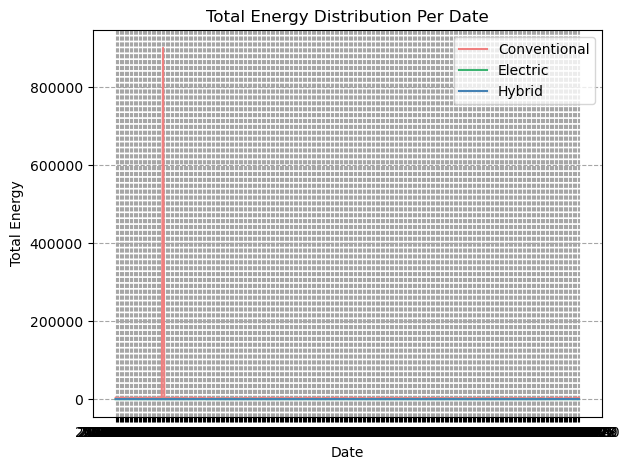

In [8]:
# Step 1: Aggregate the Energy based on Date and Powertrain
df_all_gal=df.copy()

# Conditionally modify Energy values based on Powertrain column
df_all_gal.loc[df_all_gal['Powertrain'] == 'electric', 'Energy'] = df_all_gal['Energy'] / 33.7
df_all_gal = df_all_gal.groupby(['Date', 'Powertrain'])['Energy'].sum().unstack().fillna(0)

# Step 2: Plot a time series line chart
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}
colors = [color_label_map[powertrain][0] for powertrain in df_all_gal.columns]
labels = [color_label_map[powertrain][1] for powertrain in df_all_gal.columns]

for column, color, label in zip(df_all_gal.columns, colors, labels):
    plt.plot(df_all_gal.index, df_all_gal[column], color=color, label=label)

# Step 3: Format the plot
plt.title('Total Energy Distribution Per Date')
plt.xlabel('Date')
plt.ylabel('Total Energy')
plt.legend()
plt.tight_layout()
plt.grid(True, which="both", ls="--", c='0.65')
plt.show()


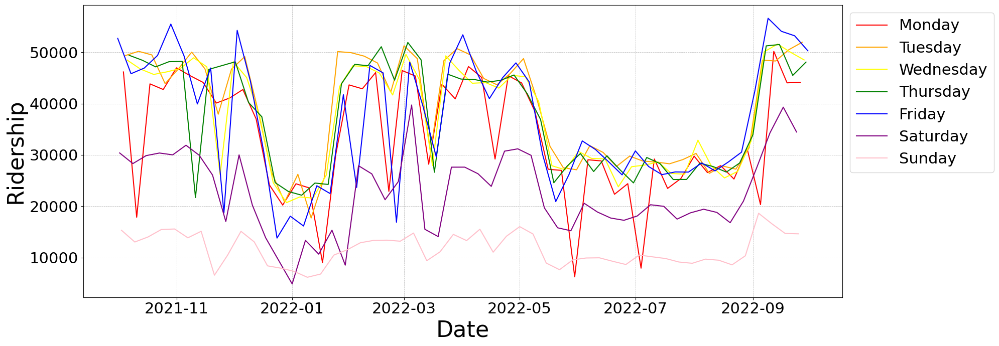

In [9]:
# Convert ServiceDateTime to datetime format
df['ServiceDateTime'] = pd.to_datetime(df['ServiceDateTime'])

# Create a new column for the day of the week
df['DayOfWeek'] = df['ServiceDateTime'].dt.day_name()

# Aggregate data by ServiceDateTime and DayOfWeek
daily_ridership = df.groupby([df['ServiceDateTime'].dt.date, 'DayOfWeek']).agg({'Boards': 'sum', 'Alights': 'sum'}).reset_index()
daily_ridership['TotalRidership'] = daily_ridership['Boards'] + daily_ridership['Alights']

# Define colors for each day of the week
colors = {
    'Monday': 'red',
    'Tuesday': 'orange',
    'Wednesday': 'yellow',
    'Thursday': 'green',
    'Friday': 'blue',
    'Saturday': 'purple',
    'Sunday': 'pink'
}

# Plotting
plt.figure(figsize=(20, 7))
for day, color in colors.items():
    subset = daily_ridership[daily_ridership['DayOfWeek'] == day]
    plt.plot(subset['ServiceDateTime'], subset['TotalRidership'], label=day, color=color)

#plt.title('Ridership Timeseries by Day of Week')
plt.xlabel('Date', fontsize=32)
plt.ylabel('Ridership', fontsize=32)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), fontsize=22)


plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [84]:
df.loc[df['Powertrain'] == 'conventional', 'VehicleModel'].mode()

0    NEW FLYER XD40
Name: VehicleModel, dtype: object

In [85]:
df.loc[df['Powertrain'] == 'conventional', 'Vehicle_mass'].mode()

0    28250
Name: Vehicle_mass, dtype: int64

In [86]:
df_validation_heb = pd.read_csv(r'../../results/validation-vs-computed-fuel-rates-heb-oct2021-sep2022.csv', delimiter=',', skiprows=0, low_memory=False)

In [87]:
df_validation_cdb = pd.read_csv(r'../../results/validation-vs-computed-fuel-rates-cdb-oct2021-sep2022.csv', delimiter=',', skiprows=0, low_memory=False)

In [88]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'ServiceDateTime', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Vehicle',
       'VehicleType', 'SeatedCap', 'TotalCap', 'Lat', 'Lon', 'Boards',
       'Alights', 'Onboard', 'Bike', 'Daytype', 'Hour', 'Minute', 'Second',
       'Date', 'Powertrain', 'VehicleModel', 'Vehicle_mass',
       'time_delta_in_seconds', 'dist', 'Speed', 'Acceleration', 'elevation',
       'grade', 'Energy'],
      dtype='object')

In [89]:
df['Route'].unique()

array(['R44', '39E', '9999', '(X) 39E', 'B48', '801', '806', 'B6', 'R14',
       'X92', 'G73', 'X90', '821', '820', 'P11', '804', '805', '824',
       '823', '802', '892', '803', 'R24', '(X) P11', 'B17', 'R10', 'G3',
       'B4', 'B7', 'R29', 'B23', 'P20', 'G5', '(X) 821', '(X) 804',
       '(X) 892', '(X) 823', '(X) 801', '(X) 820', '(X) 802', 'G1', 'B12',
       'G2', '921', '(X) 805', '(X) 824', '(X) 803', 'P21', '(X) 902',
       '(X) 806', '890', 'B9', '(X) B9', 'R42', 'R41', 'B79', '38', '30',
       '31', '33', '46', '45', '(X) 38', '36', '35', '34', '(X) 34',
       'B43', '943', '(X) 943'], dtype=object)

In [90]:
# replace all occurrences of '(X)' with an empty string
df['Route'] = df['Route'].str.replace(r'\(X\)|\(\)', '', regex=True)

In [91]:
df['Route'].unique()

array(['R44', '39E', '9999', ' 39E', 'B48', '801', '806', 'B6', 'R14',
       'X92', 'G73', 'X90', '821', '820', 'P11', '804', '805', '824',
       '823', '802', '892', '803', 'R24', ' P11', 'B17', 'R10', 'G3',
       'B4', 'B7', 'R29', 'B23', 'P20', 'G5', ' 821', ' 804', ' 892',
       ' 823', ' 801', ' 820', ' 802', 'G1', 'B12', 'G2', '921', ' 805',
       ' 824', ' 803', 'P21', ' 902', ' 806', '890', 'B9', ' B9', 'R42',
       'R41', 'B79', '38', '30', '31', '33', '46', '45', ' 38', '36',
       '35', '34', ' 34', 'B43', '943', ' 943'], dtype=object)

In [92]:
df['Route'] = df['Route'].str.lstrip()

In [93]:
df['Route'].unique()

array(['R44', '39E', '9999', 'B48', '801', '806', 'B6', 'R14', 'X92',
       'G73', 'X90', '821', '820', 'P11', '804', '805', '824', '823',
       '802', '892', '803', 'R24', 'B17', 'R10', 'G3', 'B4', 'B7', 'R29',
       'B23', 'P20', 'G5', 'G1', 'B12', 'G2', '921', 'P21', '902', '890',
       'B9', 'R42', 'R41', 'B79', '38', '30', '31', '33', '46', '45',
       '36', '35', '34', 'B43', '943'], dtype=object)

In [94]:
df_diesel=df.loc[df['Powertrain']!='electric']
df_diesel_sum = df_diesel.groupby(['Powertrain', 'Date', 'Route'])['Energy'].sum()
df_diesel_sum=df_diesel_sum.reset_index()
df_diesel_mean = df_diesel_sum.groupby(['Powertrain', 'Route'])['Energy'].mean()

In [95]:
df_diesel_mean

Powertrain    Route
conventional  30         82.552705
              31       2604.448276
              33         55.808709
              34         62.351558
              35         67.338592
                          ...     
hybrid        R14         9.432773
              R29         7.155654
              R44         4.788096
              X90        21.533847
              X92         7.825378
Name: Energy, Length: 93, dtype: float64

In [96]:
# Convert the Series to a DataFrame
df_diesel_mean = pd.DataFrame(df_diesel_mean)
df_diesel_mean=df_diesel_mean.reset_index()
df_diesel_mean

,Powertrain,Route,Energy
0,conventional,30,82.552705
1,conventional,31,2604.448276
2,conventional,33,55.808709
3,conventional,34,62.351558
4,conventional,35,67.338592
...,...,...,...
88,hybrid,R14,9.432773
89,hybrid,R29,7.155654
90,hybrid,R44,4.788096
91,hybrid,X90,21.533847


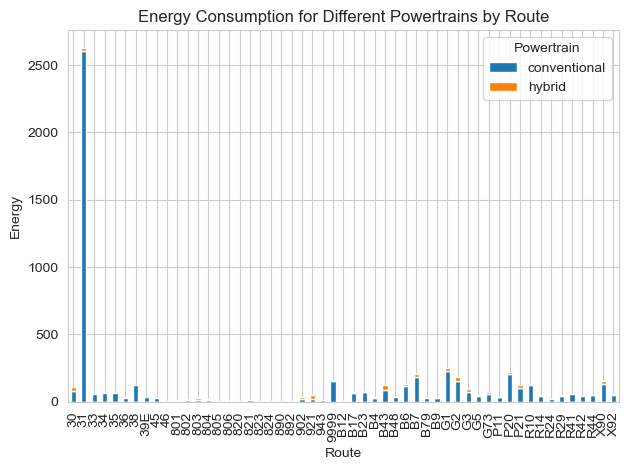

In [97]:
df_pivot = df_diesel_mean.pivot(index='Route', columns='Powertrain', values='Energy')

df_pivot.plot(kind='bar', stacked=True)

plt.ylabel('Energy')
plt.title('Energy Consumption for Different Powertrains by Route')
plt.tight_layout()
plt.show()


In [98]:
df_electric=df.loc[df['Powertrain']=='electric']
df_electric_sum = df_electric.groupby(['Powertrain', 'Date', 'Route'])['Energy'].sum()
df_electric_sum=df_electric_sum.reset_index()
df_electric_mean = df_electric_sum.groupby(['Powertrain', 'Route'])['Energy'].mean()

In [99]:
df_electric_mean

Powertrain  Route
electric    30       127.043269
            31        84.746434
            33       131.195111
            36        49.296226
            45       123.127208
            46        12.320501
            801       12.569586
            802       18.435581
            803       14.090796
            804       12.575224
            805       10.009138
            806        4.309390
            820       14.260835
            821       14.455554
            823        6.316625
            824        5.191524
            890        5.248698
            892       19.618386
            902       43.543719
            921       68.470427
            943       12.690599
            9999      29.392260
            B12       13.243297
            B17      194.160652
            B23       82.497884
            B4        73.513497
            B43       84.676505
            B48       67.486244
            B6       157.916139
            B7       165.056337
            G1       2

In [100]:
# convert gallons of diesel to kwh
df_gal = df.copy()
# Devide Energy by 33.7 where Powertrain is 'conventional' or 'hybrid'
df_gal.loc[df_gal['Powertrain'].isin(['electric']), 'Energy'] = df_gal['Energy'] / 33.7

In [101]:
# convert gallons of diesel to kwh
df_kwh = df.copy()
# multiply Energy by 33.7 where Powertrain is 'conventional' or 'hybrid'
df_kwh.loc[df_kwh['Powertrain'].isin(['conventional', 'hybrid']), 'Energy'] = df_kwh['Energy'] * 33.7

In [102]:
# Preparation for plotting
df_model_aggregated_routes = df_kwh.groupby(['Route','Date' ,'Hour']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['Date'] = pd.to_datetime(df_model_aggregated_routes['Date'])
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("X","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\3933258828.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\3933258828.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")


In [103]:
df_model_aggregated_routes = df_model_aggregated_routes.groupby(['Route','Hour']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['fuel_economy']=df_model_aggregated_routes['dist']/df_model_aggregated_routes['Energy']
df_model_aggregated_routes['energy_intensity']=df_model_aggregated_routes['Energy']/df_model_aggregated_routes['Onboard']

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\1764107466.py:7: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "Energy"), cmap="YlOrRd")


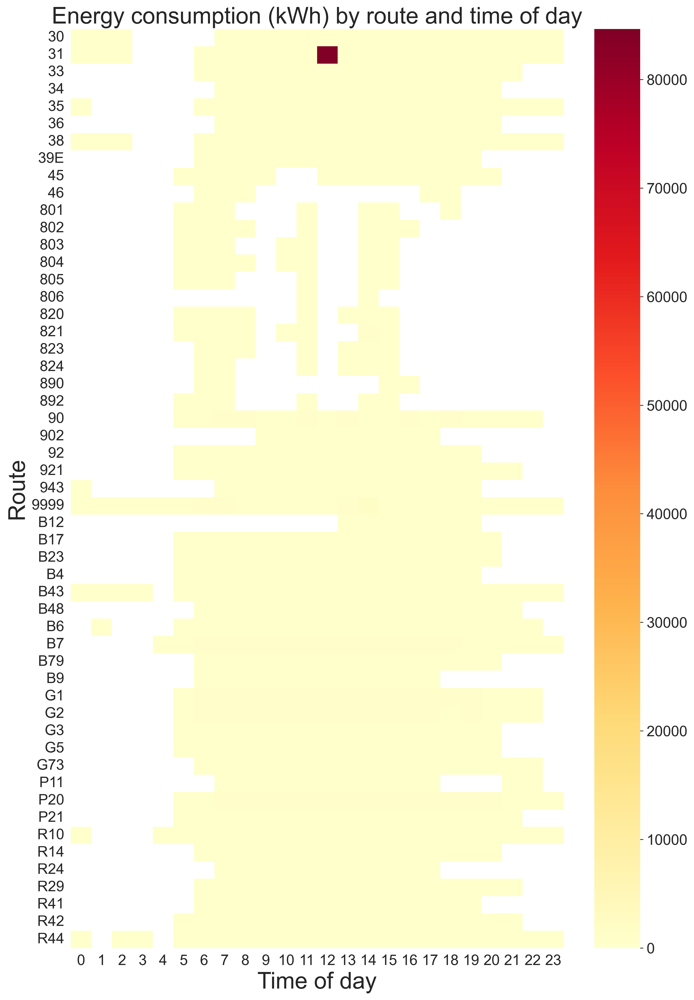

In [104]:
# Set the style of the plot
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(12, 18), dpi=400)


# Create the heatmap
heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "Energy"), cmap="YlOrRd")
plt.ylabel('Route', fontsize=25)
plt.xlabel('Time of day', fontsize=25)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)


# Set the title of the plot
plt.title("Energy consumption (kWh) by route and time of day", fontsize=25)

# Show the plot
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\3640767148.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap =sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "fuel_economy"), cmap="YlOrRd")


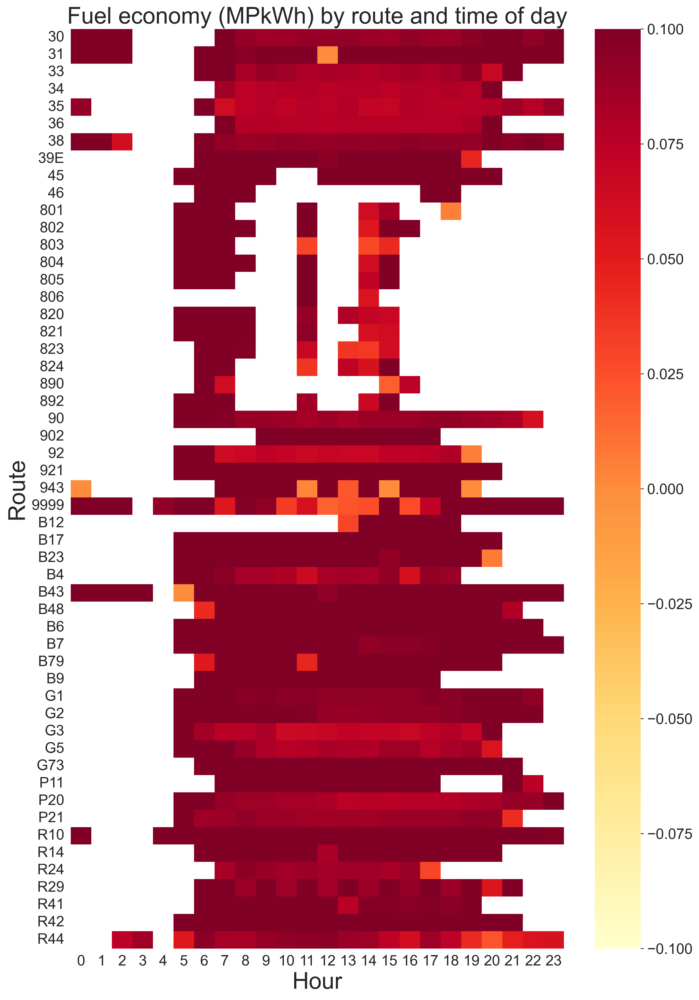

In [105]:
# Set the style of the plot
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(12, 18), dpi=400)
plt.ylabel('Route', fontsize=25)
plt.xlabel('Time of day', fontsize=25)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Create the heatmap
heatmap =sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "fuel_economy"), cmap="YlOrRd")

# Set the title of the plot
plt.title("Fuel economy (MPkWh) by route and time of day", fontsize=25)

cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)

# Show the plot
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\2816409389.py:7: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "energy_intensity"), cmap="YlOrRd")


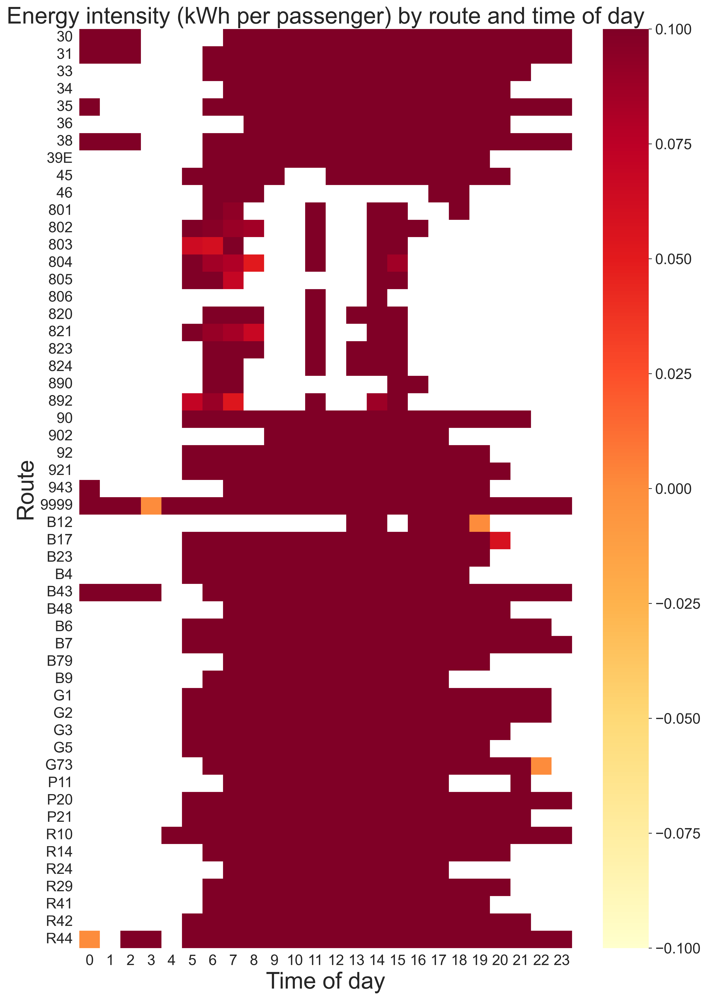

In [106]:
# Set the style of the plot
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(12, 18), dpi=400)


# Create the heatmap
heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "energy_intensity"), cmap="YlOrRd")
plt.ylabel('Route', fontsize=25)
plt.xlabel('Time of day', fontsize=25)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)


# Set the title of the plot
plt.title("Energy intensity (kWh per passenger) by route and time of day", fontsize=25)

# Show the plot
plt.show()

In [107]:
df_model_aggregated_routes.columns

Index(['Route', 'Hour', 'Energy', 'dist', 'Onboard', 'Powertrain',
       'VehicleModel', 'fuel_economy', 'energy_intensity'],
      dtype='object')

In [108]:
# Preparation for monthly plotting
df_model_aggregated_routes_daily = df_kwh.groupby(['Route','Date']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['Date'] = pd.to_datetime(df_model_aggregated_routes_daily['Date'])
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("X","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\1829833832.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\1829833832.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")


In [109]:
df_model_aggregated_routes_daily = df_model_aggregated_routes_daily.groupby(['Route','Date']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['fuel_economy']=df_model_aggregated_routes_daily['dist']/df_model_aggregated_routes_daily['Energy']
df_model_aggregated_routes_daily['energy_intensity']=df_model_aggregated_routes_daily['Energy']/df_model_aggregated_routes_daily['Onboard']

In [110]:
# Remove one bad points for route 31
df_model_aggregated_routes_daily=df_model_aggregated_routes_daily.loc[df_model_aggregated_routes_daily['Energy']<1000]

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\1705276135.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_sorted.index, rotation=90)


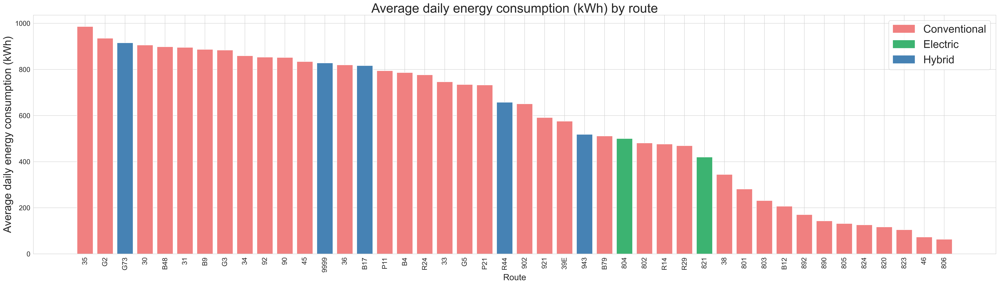

In [111]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_energy = df_model_aggregated_routes_daily.groupby('Route')['Energy'].mean()
mean_energy_sorted = mean_energy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_sorted.index, mean_energy_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy consumption (kWh)', fontsize=25)
ax.set_title('Average daily energy consumption (kWh) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\3702788209.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)


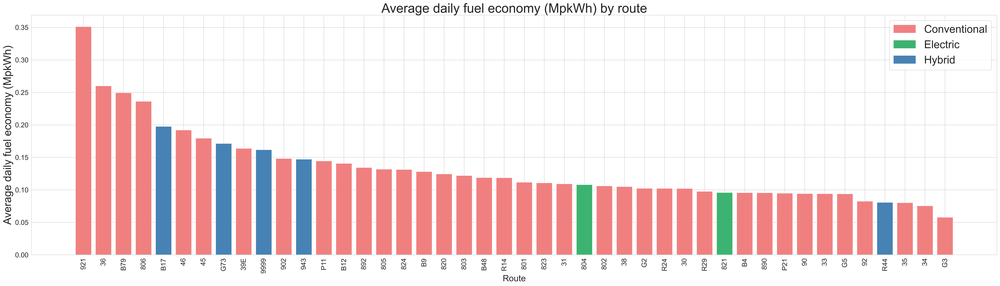

In [112]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_fuel_economy = df_model_aggregated_routes_daily.groupby('Route')['fuel_economy'].mean()
mean_fuel_economy_sorted = mean_fuel_economy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_fuel_economy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_fuel_economy_sorted.index, mean_fuel_economy_sorted.values, color=colors)
ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily fuel economy (MpkWh)', fontsize=25)
ax.set_title('Average daily fuel economy (MpkWh) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\236952869.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)


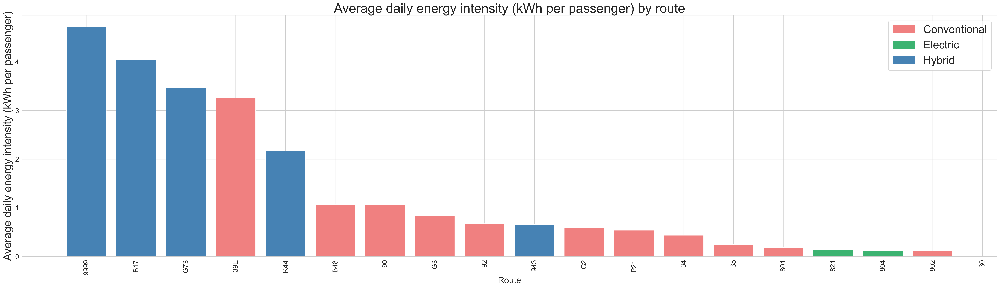

In [113]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_energy_intensity = df_model_aggregated_routes_daily.groupby('Route')['energy_intensity'].mean()
mean_energy_intensity_sorted = mean_energy_intensity.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_intensity_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_intensity_sorted.index, mean_energy_intensity_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy intensity (kWh per passenger)', fontsize=25)
ax.set_title('Average daily energy intensity (kWh per passenger) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

In [114]:
# Preparation for plotting ****gal
df_model_aggregated_routes = df_gal.groupby(['Route','Date' ,'Hour']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['Date'] = pd.to_datetime(df_model_aggregated_routes['Date'])
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("X","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\3975989120.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\3975989120.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")


In [115]:
df_model_aggregated_routes = df_model_aggregated_routes.groupby(['Route','Hour']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['fuel_economy']=df_model_aggregated_routes['dist']/df_model_aggregated_routes['Energy']
df_model_aggregated_routes['energy_intensity']=df_model_aggregated_routes['Energy']/df_model_aggregated_routes['Onboard']

In [116]:
# Preparation for monthly plotting
df_model_aggregated_routes_daily = df_kwh.groupby(['Route','Date']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['Date'] = pd.to_datetime(df_model_aggregated_routes_daily['Date'])
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("X","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\1829833832.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\1829833832.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")


In [117]:
df_model_aggregated_routes_daily = df_model_aggregated_routes_daily.groupby(['Route','Date']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['fuel_economy']=df_model_aggregated_routes_daily['dist']/df_model_aggregated_routes_daily['Energy']
df_model_aggregated_routes_daily['energy_intensity']=df_model_aggregated_routes_daily['Energy']/df_model_aggregated_routes_daily['Onboard']

In [118]:
# Remove one bad points for route 31
df_model_aggregated_routes_daily=df_model_aggregated_routes_daily.loc[df_model_aggregated_routes_daily['Energy']<1000]

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\2047985534.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_sorted.index, rotation=90)


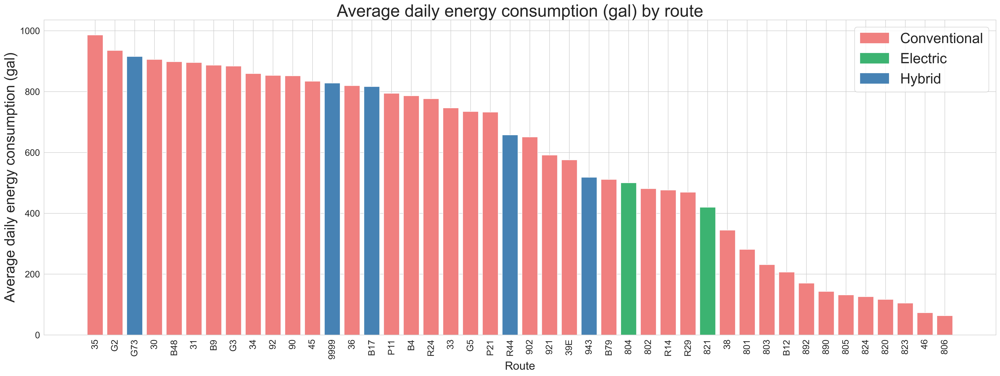

In [119]:
fig, ax = plt.subplots(figsize=(30, 10), dpi=400)
mean_energy = df_model_aggregated_routes_daily.groupby('Route')['Energy'].mean()
mean_energy_sorted = mean_energy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_sorted.index, mean_energy_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy consumption (gal)', fontsize=25)
ax.set_title('Average daily energy consumption (gal) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\4086797695.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)


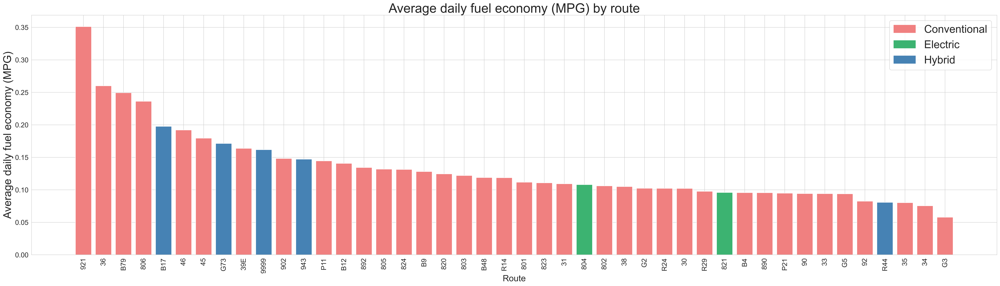

In [120]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_fuel_economy = df_model_aggregated_routes_daily.groupby('Route')['fuel_economy'].mean()
mean_fuel_economy_sorted = mean_fuel_economy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_fuel_economy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_fuel_economy_sorted.index, mean_fuel_economy_sorted.values, color=colors)
ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily fuel economy (MPG)', fontsize=25)
ax.set_title('Average daily fuel economy (MPG) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_53256\140125491.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)


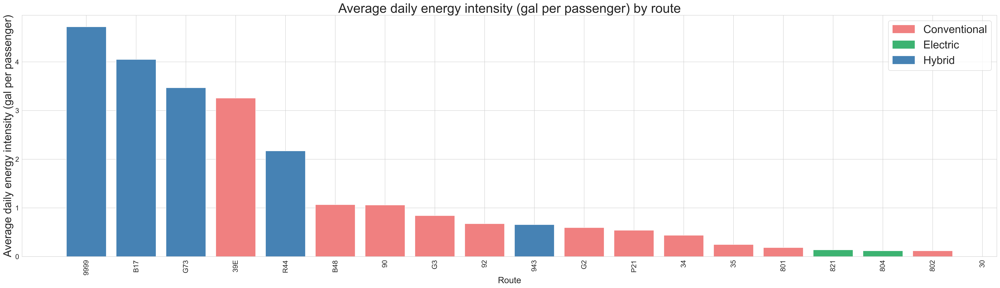

In [121]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_energy_intensity = df_model_aggregated_routes_daily.groupby('Route')['energy_intensity'].mean()
mean_energy_intensity_sorted = mean_energy_intensity.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_intensity_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_intensity_sorted.index, mean_energy_intensity_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy intensity (gal per passenger)', fontsize=25)
ax.set_title('Average daily energy intensity (gal per passenger) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

In [122]:
df_row_with_max_energy = df_kwh[df_kwh['Energy'] == df_kwh['Energy'].max()]
df_row_with_max_energy[['ServiceDateTime','Route','Powertrain','Stop', 'dist', 'Speed', 'Acceleration', 'Energy']]

,ServiceDateTime,Route,Powertrain,Stop,dist,Speed,Acceleration,Energy
14111566,2021-11-07 12:21:14,31,conventional,9,4.556807,6600.10601,284.713424,3.030761e+07


In [123]:
# Remove one bad points for route 31
df_kwh=df_kwh.loc[df_kwh['Energy']<1000]

In [124]:
# Create a pivot table
pivot_df = df_kwh.pivot_table(values='Energy', index='Route', columns='Powertrain', aggfunc='sum')

# Fill NaN values with 0
pivot_df = pivot_df.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df = pivot_df.loc[pivot_df.sum(axis=1).sort_values(ascending=False).index]
pivot_df = pivot_df[['conventional', 'hybrid', 'electric']]

In [125]:
# Drop the row where Route is 9999
pivot_df = pivot_df.drop('9999', axis=0)

In [126]:
pivot_df

Powertrain,conventional,hybrid,electric
Route,,,
G1,2.759708e+06,104305.965913,28549.224191
P20,2.498267e+06,95604.132667,10201.838962
B7,2.224880e+06,82490.160079,17330.915382
G2,1.920972e+06,85776.050917,7624.486873
X90,1.604055e+06,2177.071883,2250.740177
R10,1.517217e+06,5809.253364,5385.273065
B6,1.432280e+06,63937.215788,13580.787947
P21,1.260246e+06,57224.195950,1508.250224
B43,1.054618e+06,252808.531669,10923.269130


In [127]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df.plot(kind='bar', stacked=True, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly energy consumption (kWh)', fontsize=35)
ax.set_title('Yearly energy consumption (kWh) by route and powertrain', fontsize=40)

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)

# Create the legend
ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [128]:
df_emissions = df_gal.copy()
df_emissions = df_emissions[df_emissions['Powertrain'] != 'electric']
df_emissions['emissions'] = df_emissions['Energy'] * 0.01086879 ### For each gallon of diesel burned, 9.86 kgCO$_2$e of greenhouse gas (GHG) emissions are produced.

In [129]:
df_row_with_max_energy = df_emissions[df_emissions['Energy'] == df_emissions['Energy'].max()]
df_row_with_max_energy[['ServiceDateTime','Route','Powertrain','Stop', 'dist', 'Speed', 'Acceleration', 'Energy', 'emissions']]

,ServiceDateTime,Route,Powertrain,Stop,dist,Speed,Acceleration,Energy,emissions
14111566,2021-11-07 12:21:14,31,conventional,9,4.556807,6600.10601,284.713424,899335.672905,9774.690568


In [130]:
# Remove one bad points for route 31
df_emissions=df_emissions.loc[df_emissions['Energy']<1000]

In [131]:
# Create a pivot table
pivot_df_emissions = df_emissions.pivot_table(values='emissions', index='Route', columns='Powertrain', aggfunc='sum')

# Drop the row where Route is 9999
#pivot_df = pivot_df.drop('9999', axis=0)

# Fill NaN values with 0
pivot_df_emissions = pivot_df_emissions.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df_emissions = pivot_df_emissions.loc[pivot_df_emissions.sum(axis=1).sort_values(ascending=False).index]

# Drop the row where Route is 9999
pivot_df_emissions = pivot_df_emissions.drop('9999', axis=0)

In [132]:
pivot_df_emissions

Powertrain,conventional,hybrid
Route,,
G1,890.049986,33.640345
P20,805.731276,30.833865
B7,717.559401,26.604398
G2,619.544262,27.664151
X90,517.333507,0.702141
R10,489.326819,1.873577
B6,461.933340,21.297071
B43,340.131188,87.665248
P21,406.449483,18.455720


In [133]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions.plot(kind='bar', stacked=True, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions (tCO2e)', fontsize=35)
ax.set_title('Yearly emissions (tCO2e) by route and powertrain', fontsize=40)

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)

# Create the legend
ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [134]:
df_emissions_daily = df_emissions.groupby(['Route']).agg({
    'Energy': 'sum',
    'emissions': 'sum',
    'Onboard': 'sum',
    'dist': 'sum',
    'Powertrain': lambda x: x.mode()[0] if not x.mode().empty else None
}).reset_index()

In [135]:
df_emissions_daily['emissions-per-passanger']=df_emissions_daily['emissions']/df_emissions_daily['Onboard']
df_emissions_daily['emissions-per-mile']=df_emissions_daily['emissions']/df_emissions_daily['dist']

In [136]:
# Create a pivot table
pivot_df_emissions = df_emissions_daily.pivot_table(values='emissions-per-passanger', index='Route', columns='Powertrain', aggfunc='sum')

# Fill NaN values with 0
pivot_df_emissions = pivot_df_emissions.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df_emissions = pivot_df_emissions.loc[pivot_df_emissions.sum(axis=1).sort_values(ascending=False).index]

# Drop the row where Route is 9999
pivot_df_emissions = pivot_df_emissions.drop('9999', axis=0)

In [137]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions.plot(kind='bar', stacked=True, legend=False, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions per passanger (tCO2e)', fontsize=35)
ax.set_title('Yearly emissions per passanger (tCO2e) by route', fontsize=40)

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)

# Create the legend
#ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [138]:
# Create a pivot table
pivot_df_emissions = df_emissions_daily.pivot_table(values='emissions-per-mile', index='Route', columns='Powertrain', aggfunc='sum')

# Fill NaN values with 0
pivot_df_emissions = pivot_df_emissions.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df_emissions = pivot_df_emissions.loc[pivot_df_emissions.sum(axis=1).sort_values(ascending=False).index]

# Drop the row where Route is 9999
pivot_df_emissions = pivot_df_emissions.drop('9999', axis=0)

In [139]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions.plot(kind='bar', stacked=True, legend=False, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions (tCO2e) \n per mile traveled', fontsize=35)
ax.set_title('Yearly emissions (tCO2e) per mile traveled by route', fontsize=40)

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)

# Create the legend
#ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [140]:
unique_trip_counts_per_day = df.groupby('Date')['TripKey'].nunique()

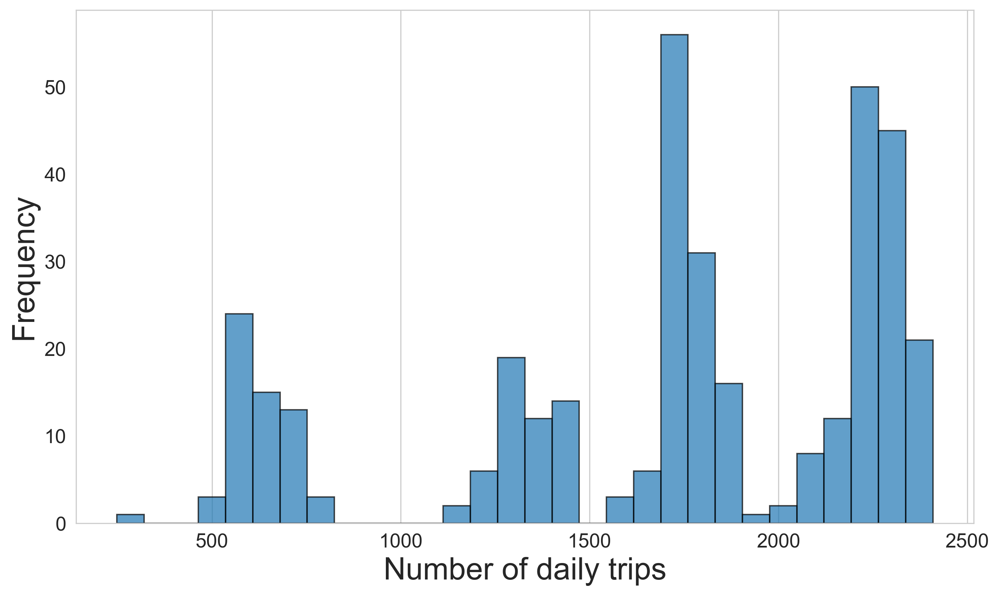

In [141]:
# Using matplotlib
plt.figure(figsize=(10, 6), dpi=300)

# Plotting the histogram
plt.hist(unique_trip_counts_per_day, bins=30, edgecolor='black', alpha=0.7)

# Setting labels, title, and adjusting their font sizes
plt.xlabel('Number of daily trips', fontsize=22)
plt.ylabel('Frequency', fontsize=22)

# Adjusting tick font sizes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Displaying the grid and the plot
plt.grid(axis='y')
plt.tight_layout()
plt.show()


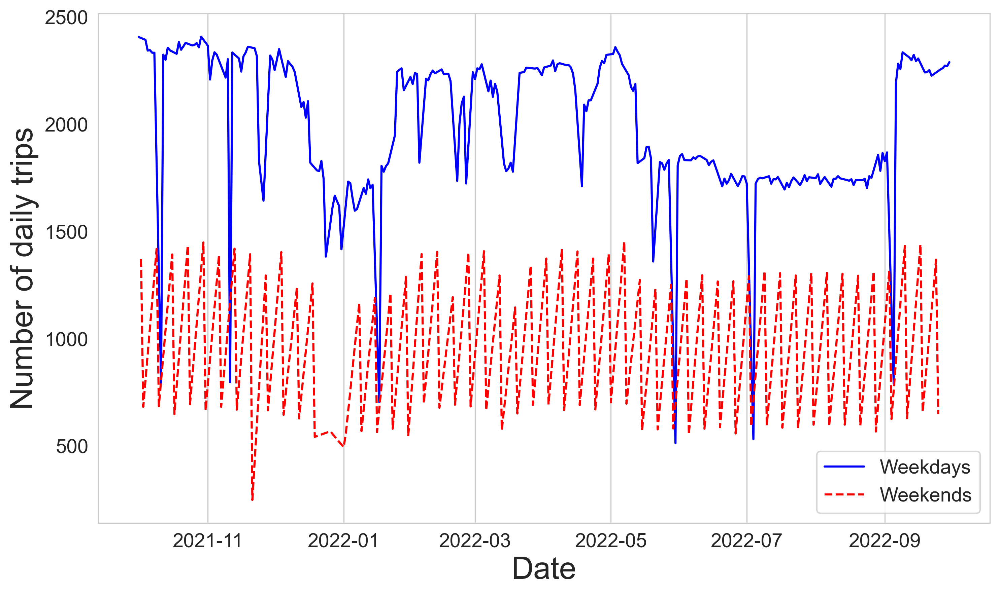

In [144]:
# Group by Date and get the unique TripKeys for each day
unique_trip_counts_per_day = df.groupby('Date')['TripKey'].nunique()

# Convert the index to datetime format and get the day of the week for each date
unique_trip_counts_per_day.index = pd.to_datetime(unique_trip_counts_per_day.index)
day_of_week = unique_trip_counts_per_day.index.dayofweek

# Define weekdays and weekends
weekdays = unique_trip_counts_per_day[(day_of_week >= 0) & (day_of_week <= 4)]
weekends = unique_trip_counts_per_day[(day_of_week >= 5) & (day_of_week <= 6)]

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(weekdays.index, weekdays.values, label='Weekdays', color='blue')
plt.plot(weekends.index, weekends.values, label='Weekends', color='red', linestyle='--')

# Labeling and setting up the plot
plt.xlabel('Date', fontsize=22)
plt.ylabel('Number of daily trips', fontsize=22)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y')
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()
